# Libraries

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
import seaborn as sns
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from collections import Counter
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, f1_score
from sklearn.metrics import roc_curve, auc

# Load LBP Dataset

In [4]:
df_lbp = pd.read_csv('../data/processed/lbp_relevant_features.csv')
print(df_lbp.shape)
df_lbp.head()

(500, 605)


,0,1,2,3,4,5,6,7,8,9,...,595,596,597,598,599,600,601,602,603,label
0,-0.279549,0.857329,-0.058696,-0.817897,-0.139368,0.525741,-0.650248,-0.405723,0.725578,0.384328,...,-0.975806,-1.245836,-1.465982,-1.538145,-0.118645,0.282042,1.923983,0.792763,0.781198,0
1,0.732031,-1.519383,-0.658446,0.588078,0.112805,0.525741,0.290857,-1.097547,0.102863,0.384328,...,-0.786634,0.211447,0.411938,-0.345230,-0.958350,-0.435743,-0.205423,0.026041,-0.122400,0
2,-1.326417,0.386269,-0.738412,-0.665900,0.196863,-0.070878,-0.816326,0.757799,0.379626,-1.419259,...,0.321377,-0.352662,0.093046,-0.583813,-1.402900,0.282042,-0.501688,0.374551,-0.696451,0
3,-0.738289,-0.041967,-0.498512,0.322082,0.112805,-0.190202,1.259641,-0.122704,1.325230,0.414139,...,-1.462250,-1.668918,-0.154981,-1.657436,0.177721,0.234189,1.461069,0.221206,1.442064,0
4,0.073328,-0.641498,-0.498512,0.284083,-0.223425,-1.144794,-0.622569,-0.154151,-0.381471,-0.778315,...,-0.056968,-0.493690,-0.615603,1.563435,0.177721,-0.483596,-0.575754,-0.336410,-0.914377,0


# Reorder aleatory dataset

In [ ]:
df_lbp = df_lbp.sample(frac=1, random_state=42).reset_index(drop=True)
print(df_lbp['label'].value_counts())
df_lbp.head()

label
1    250
0    250
Name: count, dtype: int64


,0,1,2,3,4,5,6,7,8,9,...,595,596,597,598,599,600,601,602,603,label
0,0.496780,0.664623,1.300738,-0.019912,0.911353,1.082586,0.623011,-0.657295,-1.050313,-0.614352,...,0.321377,1.057611,-0.048684,0.847686,1.363187,0.617008,0.276008,0.360611,-1.293534,1
1,0.355629,-0.962675,-1.218212,-0.589902,-0.223425,0.088220,-0.733287,-1.317673,-2.780077,-1.851523,...,0.726747,-0.352662,0.234775,-0.822396,-0.760773,-0.962119,-0.631304,-0.364291,-0.350957,0
2,1.861237,2.184862,2.140388,-0.057911,-0.139368,0.008671,0.595332,-1.286226,-1.004186,-0.092654,...,1.456413,-1.292845,0.270208,-1.597791,-0.316223,-1.297085,-0.298006,0.500015,0.843209,1
3,-0.256024,-0.705734,0.421105,1.006070,0.701209,-0.229977,0.373895,0.254654,0.148990,0.294894,...,-1.137954,0.446493,0.801694,-0.166292,-0.859561,0.951974,0.794472,0.109683,0.320540,0
4,0.073328,-0.620086,0.541055,0.284083,-0.559656,1.201910,0.429255,-0.279937,-0.127772,-0.077748,...,-0.300190,0.023411,0.978857,-0.941687,0.029538,0.760565,0.646339,0.625478,-0.292489,0


# Pairplot to select features to plot classifiers

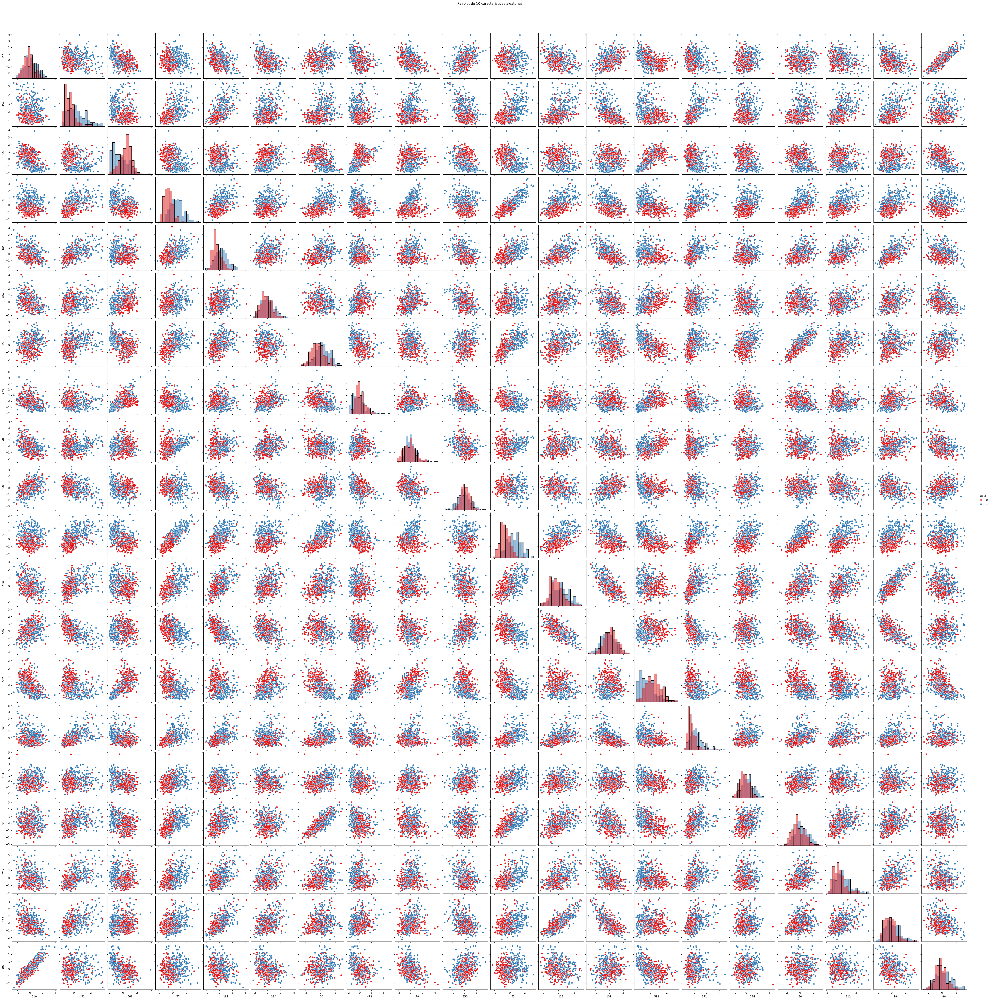

In [15]:
np.random.seed(42)
feature_cols = df_lbp.columns.drop('label')
random_features = np.random.choice(feature_cols, size=20, replace=False)

df_pairplot = df_lbp[list(random_features) + ['label']]

sns.pairplot(df_pairplot, hue='label', palette='Set1', diag_kind='hist')
plt.suptitle("Pairplot de 10 características aleatorias", y=1.02)
plt.show()

# Train and Plot classifiers

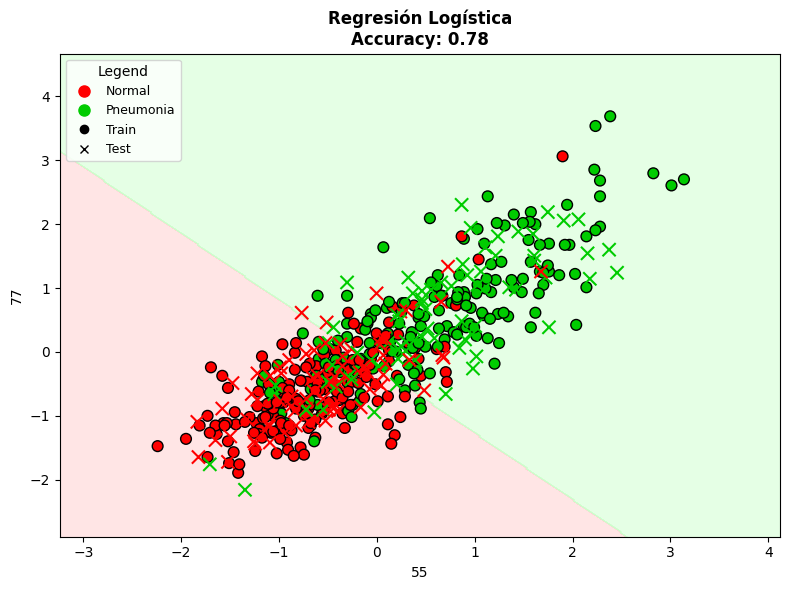

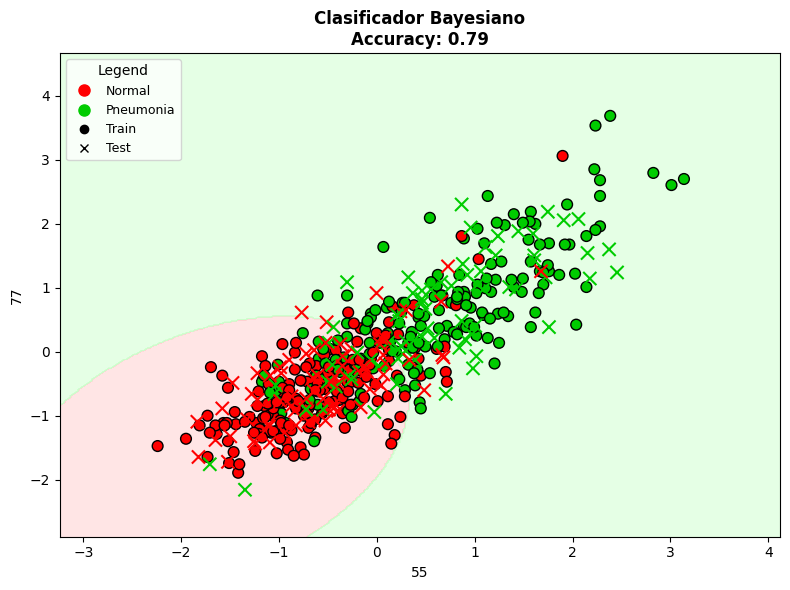

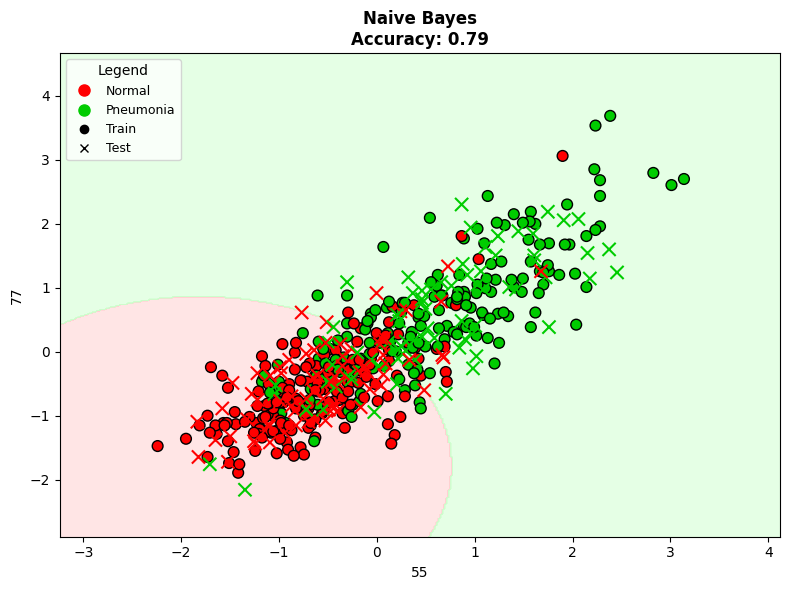

In [19]:
i, j = 55, 77
feature_names = [df_lbp.columns[i], df_lbp.columns[j]]
X = df_lbp.iloc[:, [i, j]].values
y = df_lbp['label'].values
target_names = ['Normal', 'Pneumonia']

def plot_decision_boundary(model, X_train, y_train, X_test, y_test, target_names, feature_names, title):
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.02),
                         np.arange(y_min, y_max, 0.02))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cmap_light = ListedColormap(['#FFCCCC', '#CCFFCC'])
    cmap_bold = ListedColormap(['#FF0000', '#00CC00'])
    plt.figure(figsize=(8, 6))
    plt.contourf(xx, yy, Z, cmap=cmap_light, alpha=0.5)
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cmap_bold, edgecolor='k', marker='o', s=60, label='Train')
    plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cmap_bold, marker='x', s=90, label='Test')
    handles_species = [plt.Line2D([], [], color=cmap_bold(i), marker='o', linestyle='None', markersize=8, label=target_names[i]) for i in range(len(target_names))]
    handles = handles_species + [
        plt.Line2D([], [], color='k', marker='o', linestyle='None', label='Train'),
        plt.Line2D([], [], color='k', marker='x', linestyle='None', label='Test')
    ]
    plt.legend(handles=handles, title="Legend", fontsize=9, loc='upper left')
    plt.xlabel(feature_names[0])
    plt.ylabel(feature_names[1])
    plt.title(title, fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()

def train_and_plot(model, X, y, feature_names, target_names, model_name):
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, random_state=42, stratify=y
    )
    model.fit(X_train, y_train)
    acc = model.score(X_test, y_test)
    title = f"{model_name}\nAccuracy: {acc:.2f}"
    plot_decision_boundary(model, X_train, y_train, X_test, y_test, target_names, feature_names, title)

models = [
    (LogisticRegression(), "Regresión Logística"),
    (QuadraticDiscriminantAnalysis(), "Clasificador Bayesiano"),
    (GaussianNB(), "Naive Bayes"),
]

for model, name in models:
    train_and_plot(model, X, y, feature_names, target_names, name)

# Hyperparameters Selection

In [20]:
models = {
    "Logistic Regression": (
        LogisticRegression(max_iter=1000, solver="liblinear"),
        {"C": [0.01, 0.1, 1, 10, 100]}
    ),
    "Gaussian Naive Bayes": (
        GaussianNB(),
        {}  # No hyperparameters to tune
    ),
    "Gaussian Classifier (QDA)": (
        QuadraticDiscriminantAnalysis(),
        {"reg_param": [0.0, 0.1, 0.2, 0.5, 0.8]}
    )
}

kf = KFold(n_splits=5, shuffle=True, random_state=42)
best_params_summary = {}

for name, (model, param_grid) in models.items():
    best_params_list = []
    for train_idx, test_idx in kf.split(X, y):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        if param_grid:
            grid = GridSearchCV(model, param_grid, cv=3, scoring='accuracy', n_jobs=-1)
            grid.fit(X_train, y_train)
            best_params_list.append(grid.best_params_)
        else:
            model.fit(X_train, y_train)
            best_params_list.append({})

    if best_params_list and any(best_params_list):
        param_counts = Counter(tuple(sorted(p.items())) for p in best_params_list)
        most_common_params = dict(param_counts.most_common(1)[0][0])
    else:
        most_common_params = {}

    best_params_summary[name] = most_common_params

for name, params in best_params_summary.items():
    print(f"{name}:")
    if params:
        print(f"  Best hyperparameters: {params}")
    else:
        print("  No hyperparameters to tune.")
    print()

Logistic Regression:
  Best hyperparameters: {'C': 0.01}

Gaussian Naive Bayes:
  No hyperparameters to tune.

Gaussian Classifier (QDA):
  Best hyperparameters: {'reg_param': 0.8}



# Evaluation


Logistic Regression
  Accuracy:    79.00 ± 2.61
  F1-score:    78.78 ± 2.66
  Sensitivity: 79.11 ± 2.99
  Specificity: 79.11 ± 2.99


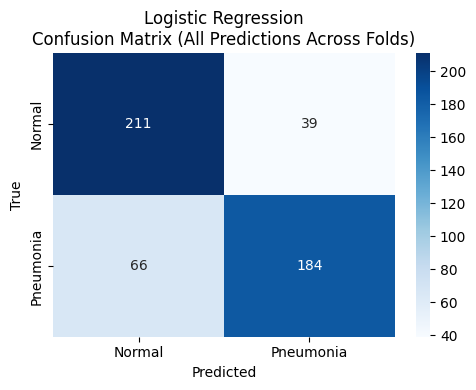


Gaussian Naive Bayes
  Accuracy:    79.00 ± 1.55
  F1-score:    78.73 ± 1.42
  Sensitivity: 79.07 ± 1.70
  Specificity: 79.07 ± 1.70


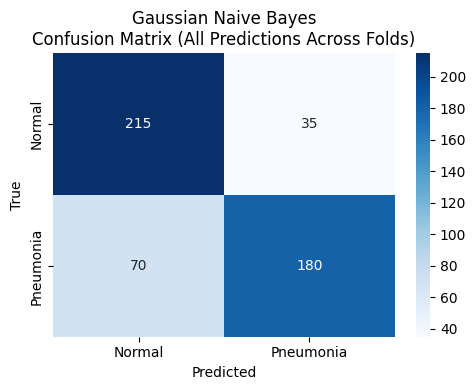


Gaussian Classifier (QDA)
  Accuracy:    79.20 ± 2.32
  F1-score:    78.97 ± 2.33
  Sensitivity: 79.31 ± 2.61
  Specificity: 79.31 ± 2.61


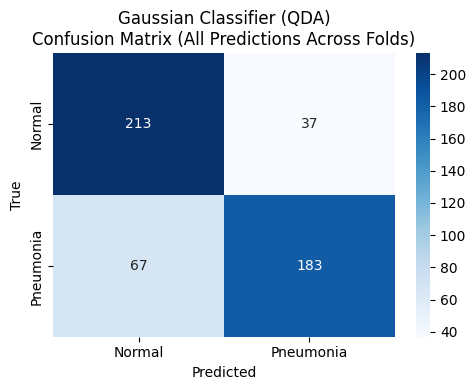

In [23]:
# Evaluation with best hyperparameters
metrics_summary = {}

for name, (model, param_grid) in models.items():
    # Assign best hyperparameters
    if name == "Logistic Regression":
        model = LogisticRegression(max_iter=1000, solver="liblinear", C=best_params_summary[name].get("C", 1.0))
    elif name == "Gaussian Classifier (QDA)":
        model = QuadraticDiscriminantAnalysis(reg_param=best_params_summary[name].get("reg_param", 0.0))
    elif name == "Gaussian Naive Bayes":
        model = GaussianNB()

    # Train and evaluate using external cross-validation
    y_true_all, y_pred_all = [], []
    acc_list, f1_list, sens_list, spec_list = [], [], [], []

    for train_idx, test_idx in kf.split(X, y):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        acc = accuracy_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred, average='macro')
        sens = recall_score(y_test, y_pred, average='macro')
        cm = confusion_matrix(y_test, y_pred)
        # Specificity (macro)
        specificity = []
        for i in range(len(cm)):
            tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
            fp = cm[:, i].sum() - cm[i, i]
            specificity.append(tn / (tn + fp))
        spec = np.mean(specificity)

        acc_list.append(acc)
        f1_list.append(f1)
        sens_list.append(sens)
        spec_list.append(spec)
        y_true_all.extend(y_test)
        y_pred_all.extend(y_pred)

    # Confusion matrix global
    cm_all = confusion_matrix(y_true_all, y_pred_all)

    metrics_summary[name] = {
        "Accuracy": (np.mean(acc_list), np.std(acc_list)),
        "F1-score": (np.mean(f1_list), np.std(f1_list)),
        "Sensitivity": (np.mean(sens_list), np.std(sens_list)),
        "Specificity": (np.mean(spec_list), np.std(spec_list)),
        "Confusion Matrix": cm_all
    }

# Display results
for name, metrics in metrics_summary.items():
    print(f"\n{name}")
    print(f"  Accuracy:    {100*metrics['Accuracy'][0]:.2f} ± {100*metrics['Accuracy'][1]:.2f}")
    print(f"  F1-score:    {100*metrics['F1-score'][0]:.2f} ± {100*metrics['F1-score'][1]:.2f}")
    print(f"  Sensitivity: {100*metrics['Sensitivity'][0]:.2f} ± {100*metrics['Sensitivity'][1]:.2f}")
    print(f"  Specificity: {100*metrics['Specificity'][0]:.2f} ± {100*metrics['Specificity'][1]:.2f}")

    plt.figure(figsize=(5, 4))
    sns.heatmap(metrics["Confusion Matrix"], annot=True, fmt="d",
                cmap="Blues", xticklabels=target_names,
                yticklabels=target_names)
    plt.title(f"{name}\nConfusion Matrix (All Predictions Across Folds)")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

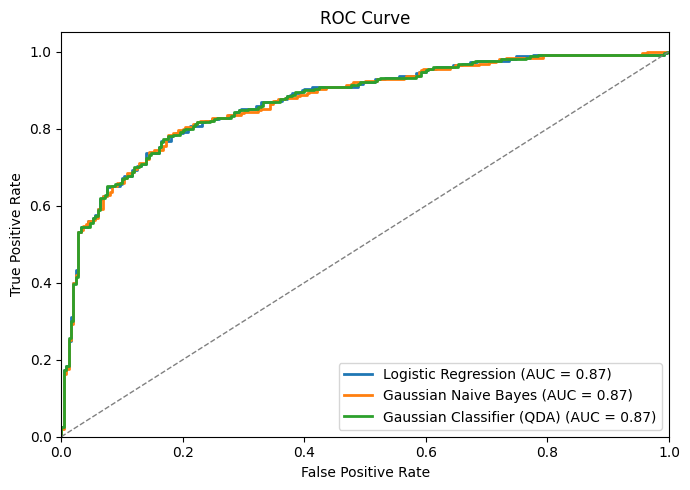

In [26]:
plt.figure(figsize=(7, 5))
for name, (model, param_grid) in models.items():
    # Asigna mejores hiperparámetros
    if name == "Logistic Regression":
        model = LogisticRegression(max_iter=1000, solver="liblinear", C=best_params_summary[name].get("C", 1.0))
    elif name == "Gaussian Classifier (QDA)":
        model = QuadraticDiscriminantAnalysis(reg_param=best_params_summary[name].get("reg_param", 0.0))
    elif name == "Gaussian Naive Bayes":
        model = GaussianNB()

    # Almacena scores y etiquetas
    y_true_all, y_score_all = [], []

    for train_idx, test_idx in kf.split(X, y):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        model.fit(X_train, y_train)
        # Para binario: usa predict_proba para obtener la probabilidad de la clase 1
        if hasattr(model, "predict_proba"):
            y_score = model.predict_proba(X_test)[:, 1]
        else:
            y_score = model.decision_function(X_test)
        y_true_all.extend(y_test)
        y_score_all.extend(y_score)

    # ROC y AUC
    fpr, tpr, _ = roc_curve(y_true_all, y_score_all)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"{name} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], linestyle="--", color="gray", lw=1)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

# Results Table

| Modelo                        | Accuracy (%)      | F1-score (%)     | Sensitivity (%)  | Specificity (%)  | AUC    |
|-------------------------------|------------------|------------------|------------------|------------------|--------|
| Logistic Regression           | 79.00 ± 2.61     | 78.78 ± 2.66     | 79.11 ± 2.99     | 79.11 ± 2.99     | 0.87   |
| Gaussian Naive Bayes          | 79.00 ± 1.55     | 78.73 ± 1.42     | 79.07 ± 1.70     | 79.07 ± 1.70     | 0.87   |
| Gaussian Classifier (QDA)     | 79.20 ± 2.32     | 78.97 ± 2.33     | 79.31 ± 2.61     | 79.31 ± 2.61     | 0.87   |

In the medical field, it is crucial to minimize false positives, meaning that negative cases (healthy patients) must be classified correctly. By analyzing the confusion matrices, Logistic Regression shows a slight advantage in correctly identifying negatives, making it the preferred choice for this context, where safety and diagnostic accuracy are essential.

Overall, all three models (Logistic Regression, Gaussian Naive Bayes, and Gaussian Classifier/QDA) achieved very similar performance metrics on this dataset, including accuracy, sensitivity, specificity, and ROC AUC. This indicates that any of them could be suitable for the task, but the final choice should consider clinical priorities and the type of error to minimize. In this case, we select Logistic Regression due to its better handling of negative cases.

## Flowchart: Summary of Experiments

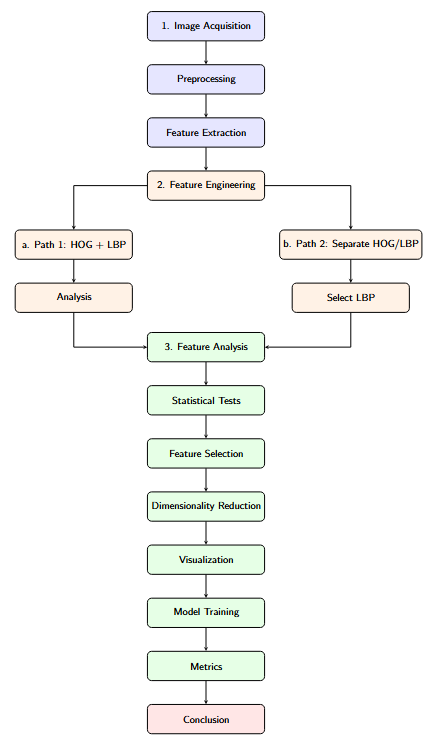

# Future Work

- **Increase Dataset Size:** Collect and annotate more chest X-ray images to improve model generalization and robustness.
- **Data Augmentation:** Apply techniques such as rotation, scaling, flipping, and noise addition to artificially expand the dataset and reduce overfitting.
- **Test More Robust Models:** Evaluate advanced machine learning and deep learning models (e.g., Random Forest, SVM, CNN architectures like ResNet, DenseNet, EfficientNet).
- **Explainability:** Integrate explainable AI techniques (e.g., Grad-CAM, SHAP) to interpret model decisions and increase clinical trust.
- **Clinical Integration:** Collaborate with medical professionals to deploy and test the model in real-world clinical settings.
- **Automated ROI Extraction:** Implement deep learning-based segmentation (e.g., U-Net) for automatic lung region extraction before classification.
- **Multi-class Classification:** Extend the approach to detect other lung pathologies (e.g., COVID-19, tuberculosis) in addition to pneumonia.